<img src='https://www.reliance-project.eu/wp-content/uploads/2021/03/Asset-8mdpi.svg' alt='Layout' align='left' width='25%'></img> 
<img src='https://media-exp1.licdn.com/dms/image/C560BAQFFDze0s3l-pQ/company-logo_200_200/0?e=2159024400&v=beta&t=jG_sh9NpwE6yc2TspIcL2YUR2X7OBzTrRSu6w7sNYtc' alt='Layout' align='right' width='10%'></img> 

# Using CAMS European air quality analysis from Copernicus Atmosphere Monitoring with RELIANCE services

## Analysis over France

<div class="alert alert-success alert-info">
<b>How to discover RELIANCE datacube resources (spatial and temporal search and subsetting)</b></div>

This notebook shows how to discover and access the [Copernicus Atmosphere Monitoring](https://ads.atmosphere.copernicus.eu/#!/home) products available in the **RELIANCE** datacube resources, by using the functionalities provided in the <font color='blue'> **Adam API** </font>. The process is structured in 6 steps, including example of data analysis and visualization with the Python libraries installed in the Jupyter environment.

- [1. Authentication](#1.Authentication)
- [2. Datasets Discovery](#2.Datasets_Discovery)
- [3. Products Discovery](#3.Products_Discovery)
- [4. Data Access](#4.Data_Access)
- [5. Data Analysis and Visualizarion](#5.Data_Analysis_Visualization)warnings.filterwarnings('ignore')

In [1]:
import warnings

In [2]:
warnings.filterwarnings('ignore')

## <a id=1.Authentication></a> **Step 1: Authentication** 

The following lines of code will show the personal **Adam API-Key** of the user and the endpoint currently in use, that provide access to the products in the related catalogue. At the end of the execution, if the authentication process is successfull the personal token and the expiration time should be returned as outputs.

In [3]:
!pip install adamapi

In [4]:
adam_key = open("adam-key").read().rstrip()

In [5]:
import adamapi as adam
a = adam.Auth()

a.setKey(adam_key)
a.setAdamCore('https://reliance.adamplatform.eu')
a.authorize() 

{'expires_at': '2021-10-11T09:59:36.493Z',
 'access_token': '64e9ab0d65804dfc8e50a6c5129015a5',
 'refresh_token': 'db06f7726b8e47d2ab19fa21726b13dc',
 'expires_in': 3600}

## <a id=2.Datasets_Discovery></a> **Step 2: Datasets Discovery**

After the authorization, the user can browse the whole catalogue, structured as a JSON object after a pagination process,  displaying all the available datasets. This operation can be executed with the <font color='blue'> **getDatasets()** </font> function without including any argument. Some lines of code should be added to parse the Json object and extract the names of the datasets.The Json object can be handled as a Python dictionary.

### Pre-filter datasets

We will discover all the available datasets in the ADAM platform but will only print elements of interest **EU_CAMS** e.g. [European air quality datasets](https://ads.atmosphere.copernicus.eu/cdsapp#!/dataset/cams-europe-air-quality-forecasts?tab=overview) from Copernicus Atmosphere Monitoring Service

In [6]:
from adamapi import Datasets

datasets = Datasets(a)
catalogue = datasets.getDatasets()

#Extracting the size of the catalogue

total = catalogue['properties']['totalResults']
items = catalogue['properties']['itemsPerPage']
pages = total//items

print('----------------------------------------------------------------------')
print('\033[1m' + 'List of available datasets:')
print ('\033[0m')

#Extracting the list of datasets across the whole catalogue

for i in range(0,pages):
    page = datasets.getDatasets(page = i)
    for element in page['content']: 
        if 'EU_CAMS' in element['title'] :
            print(element['title'] + "\033[1m" + " --> datasetId "+ "\033[0m" + "= " + element['datasetId'])

----------------------------------------------------------------------
List of available datasets:

EU_CAMS_SURFACE_C2H3NO5_G --> datasetId = 69619:EU_CAMS_SURFACE_C2H3NO5_G
EU_CAMS_SURFACE_CO_G --> datasetId = 69620:EU_CAMS_SURFACE_CO_G
EU_CAMS_SURFACE_NH3_G --> datasetId = 69621:EU_CAMS_SURFACE_NH3_G
EU_CAMS_SURFACE_NMVOC_G --> datasetId = 69622:EU_CAMS_SURFACE_NMVOC_G
EU_CAMS_SURFACE_NO2_G --> datasetId = 69623:EU_CAMS_SURFACE_NO2_G
EU_CAMS_SURFACE_NO_G --> datasetId = 69624:EU_CAMS_SURFACE_NO_G
EU_CAMS_SURFACE_O3_G --> datasetId = 69625:EU_CAMS_SURFACE_O3_G
EU_CAMS_SURFACE_PM10_G --> datasetId = 69626:EU_CAMS_SURFACE_PM10_G
EU_CAMS_SURFACE_PM25_G --> datasetId = 69627:EU_CAMS_SURFACE_PM25_G
EU_CAMS_SURFACE_REC_G --> datasetId = 69628:EU_CAMS_SURFACE_REC_G
EU_CAMS_SURFACE_SIA_G --> datasetId = 69629:EU_CAMS_SURFACE_SIA_G
EU_CAMS_SURFACE_SO2_G --> datasetId = 69630:EU_CAMS_SURFACE_SO2_G
EU_CAMS_SURFACE_TEC_G --> datasetId = 69631:EU_CAMS_SURFACE_TEC_G


We are interested by **Particulate matter < 10 µm (PM10)** so we will discover **EU_CAMS_SURFACE_PM10_G** and print the metadata of this particular dataset, showing the data provenance.

In [7]:
datasetID = '69626:EU_CAMS_SURFACE_PM10_G'

print('\033[1;34m' + 'Metadata of ' + datasetID + ':')
print ('\033[0;0m')

paged = datasets.getDatasets(datasetID)
for i in paged.items():
    print("\033[1m" +  str(i[0]) + "\033[0m" + ': ' + str(i[1]))

Metadata of 69626:EU_CAMS_SURFACE_PM10_G:

datasetId: 69626:EU_CAMS_SURFACE_PM10_G
creationDate: 2021-07-12T02:00:00Z
dataType: Float32
epsg: 4326
keywords: []
license: {'documentationUrl': '', 'dataProviderName': 'ADS', 'dataProviderUrl': '', 'licenseId': '', 'dataPolicy': '', 'doi': '', 'credits': ''}
maxValue: [2645.995849609375]
minValue: [0.003789698239415884]
numberOfRecords: 56894
profile: {'profileSchema': 'eo_profile_schema.json', 'name': 'Earth Observation', 'mission': 'CAMS', 'sensor': 'CAMS', 'processingLevel': 'forecast', 'instrument': '', 'platform': ''}
resolutionUnit: degree
temporalResolution: Hourly
unit: 
unitDescription: 
updateDate: 2021-10-10T12:01:44Z
geometry: {'type': 'Polygon', 'coordinates': [[[-25.000012, 29.999997], [44.999988, 29.999997], [44.999988, 71.999997], [-25.000012, 71.999997], [-25.000012, 29.999997]]]}
resolutions: [0.1]
anyText: 4326,ESA,Daily,ESA
applications: ['Atmosphere']
datasetManager: govoni@meeo.it
datasetManagerOrganisation: meeo
descr

## <a id=3.Products_Discovery></a> **Step 3: Products Discovery**

The products discovery operation related to a specific dataset is implemented in the Adam API with the <font color='blue'> **getProducts()** </font> function. A combined **spatial and temporal search** can be requested by specifying the <font color='red'> **datasetId** </font> for the selected dataset,the <font color='red'> **geometry** </font> argument that specifies the <u>Area Of Interest</u> and a temporal range, defined by `startDate` and `endDate` . The geometry must **<u>always</u>** be defined by a <font color='red'> **GeoJson object** </font> that describes the polygon in the **<u>counterclockwise winding order**</u>. The optional arguments `startIndex` and `maxRecords` can set the list of the results returned as an output. The results of the search are displayed with their metadata and they are sorted starting from the most recent product.

### Generate geometry for France
The geometry field is extracted from a GeoJSON object , retrieving the value of the "feature" element.


In [8]:
!wget https://raw.githubusercontent.com/mledoze/countries/master/data/fra.geo.json

--2021-10-11 08:59:42--  https://raw.githubusercontent.com/mledoze/countries/master/data/fra.geo.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 42936 (42K) [text/plain]
Saving to: ‘fra.geo.json.5’

fra.geo.json.5      100%[===================>]  41.93K  --.-KB/s    in 0.001s  

2021-10-11 08:59:43 (44.5 MB/s) - ‘fra.geo.json.5’ saved [42936/42936]



### Search data

In [9]:
!pip install geojson_rewind

In [10]:
from adamapi import Search
from geojson_rewind import rewind
import json

The GeoJson object needs to be rearranged according to the counterclockwise winding order.This operation is executed in the next few lines to obtain 
a geometry that meets the requirements of the method. **Geom_1** is the final result to be used in the discovery operation.

In [11]:
with open('fra.geo.json') as f:
    geom_dict = json.load(f)
output = rewind(geom_dict)    
geom_1 = str(geom_dict['features'][0]['geometry'])

Copernicus air quality analyses are hourly product but when we select a given date, we will only get the first 10 products. 
Below, we make a list of the first 10 available products for the 1st September 2020 e.g. we restrict our search to this date.

In [12]:
start_date = '2019-09-01'
end_date = '2019-09-01'

In [13]:
search = Search( a )
results = search.getProducts(
    datasetID, 
    geometry= geom_1,
    startDate = start_date,
    endDate = end_date
 )

# Printing the results

print('\033[1m' + 'List of available products:')
print ('\033[0m')
count = 1
for i in results['content']:

        print("\033[1;31;1m" + "#" + str(count))
        print ('\033[0m')
        for k in i.items():
            print(str(k[0]) + ': ' + str(k[1]))
        count = count+1
        print('------------------------------------')

List of available products:

#1

_id: {'$oid': '60ef2c3d6dfebc0806c75279'}
datasetId: EU_CAMS_SURFACE_PM10_G
productDate: 2019-09-01T23:00:00Z
productId: EU_CAMS_SURFACE_PM10_G_20190901230000.tif
geometry: {'geometries': [{'type': 'Polygon', 'coordinates': [[[-25.000012, 29.999997], [44.999988, 29.999997], [44.999988, 71.999997], [-25.000012, 71.999997], [-25.000012, 29.999997]]]}], 'type': 'GeometryCollection'}
insertDate: 2021-07-14T18:26:05Z
status: Online
------------------------------------
#2

_id: {'$oid': '60ef2c3d6dfebc0806c75276'}
datasetId: EU_CAMS_SURFACE_PM10_G
productDate: 2019-09-01T22:00:00Z
productId: EU_CAMS_SURFACE_PM10_G_20190901220000.tif
geometry: {'geometries': [{'type': 'Polygon', 'coordinates': [[[-25.000012, 29.999997], [44.999988, 29.999997], [44.999988, 71.999997], [-25.000012, 71.999997], [-25.000012, 29.999997]]]}], 'type': 'GeometryCollection'}
insertDate: 2021-07-14T18:26:05Z
status: Online
------------------------------------
#3

_id: {'$oid': '60ef2c3d

## <a id=4.Data_Access></a> **Step 4: Data Access**

After the data discovery operation that retrieves the availability of products in the catalogue, it is possible to access the data with the <font color='blue'> **getData** </font> function. Each product in the output list intersects the selected geometry and the following example shows how to access a specific product from the list of results obtained in the previous step. While the <font color='red'> **datasetId** </font> is always a mandatory parameter, for each data access request the <font color='blue'> **getData** </font> function needs only one of the following arguments: <font color='red'> **geometry** </font> or <font color='red'> **productId** </font>, that is the value of the <font color='blue'> **_id** </font> field in each product metadata. In the case of a <u>**spatial and temporal search**</u> the geometry must be provided to the function, together with the time range of interest. 
The output of the <font color='blue'> **getData** </font> function is <u>always</u> a <font color='red'> **.zip** </font> file containing the data retrieved with the data access request, providing the spatial **subset** of the product. The zip file will contain a geotiff file for each of the spatial subsets extracted in the selected time range.

In [14]:
from adamapi import GetData

#### Define a function to select a time range and get data

In [15]:
import pathlib

In [16]:
def getZipData(auth, dataset_info):
    if not (pathlib.Path(pathlib.Path(dataset_info['outputFname']).stem).exists() or pathlib.Path(dataset_info['outputFname']).exists()):
        data=GetData(auth)
        image = data.getData(
        datasetId = dataset_info['datasetID'],
        startDate = dataset_info['startDate'],
        endDate = dataset_info['endDate'],
        geometry = dataset_info['geometry'],
        outputFname = dataset_info['outputFname'])
        print(image)

#### Get PM10 for each day of September 2019, 2020 and 2021 (time 00:00:00)

This process can take a bit of time so be patient!

In [17]:
import time
from IPython.display import clear_output

In [18]:
start = time.time()

for year in ['2019', '2020', '2021']:
    datasetInfo = {
    'datasetID' : '69626:EU_CAMS_SURFACE_PM10_G',
    'startDate' : year + '-09-01',
    'endDate' : year + '-09-30',
    'geometry' : geom_1,
    'outputFname' : './PM10_FR_ADAMAPI_' + year + '.zip'
    }
    getZipData(a, datasetInfo)
    
end = time.time()
clear_output(wait=True)
delta1 = end - start
print('\033[1m'+'Processing time: ' + str(round(delta1,2)))

Processing time: 0.0


## <a id=5.Data_Analysis_Visualization></a> **Step 5: Data Analysis and Visualization**

The data retrieved via the Adam API are now available as a zip file that must be unzipped to directly handle the data in a geotiff format. Then with the Python packages provided in the Jupyter environment it is possible to process and visualized the requested product.

#### Unzip data

In [19]:
import zipfile

In [20]:
def unzipData(filename):
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall(path = pathlib.Path(filename).stem)

In [21]:
for year in ['2019', '2020', '2021']:
    filename = './PM10_FR_ADAMAPI_' + year + '.zip'
    if not pathlib.Path(pathlib.Path(filename).stem).exists():
        unzipData(filename)

#### Read data and make a monthly average

In [22]:
import xarray as xr
import glob

We now read these files using `xarray`. First, we make a list of all the geotiff files in a given folder. To ensure each raster is labelled correctly with its time, we can use a helper function `paths_to_datetimeindex()` to extract time information from the file paths we obtained above. We then load and concatenate each dataset along the time dimension using `xarray.open_rasterio()`, convert the resulting `xarray.DataArray` to a `xarray.Dataset`, and give the variable a more useful name (**PM10**)

In [23]:
from datetime import datetime

In [24]:
def paths_to_datetimeindex(paths):
    return  [datetime.strptime(date.split('_')[-1].split('.')[0], '%Y-%m-%dt%f') for date in paths]

In [25]:
def getData(dirtif):
    geotiff_list = glob.glob(dirtif)
    # Create variable used for time axis
    time_var = xr.Variable('time', paths_to_datetimeindex(geotiff_list))
    # Load in and concatenate all individual GeoTIFFs
    geotiffs_da = xr.concat([xr.open_rasterio(i, parse_coordinates=True) for i in geotiff_list],
                        dim=time_var)
    # Covert our xarray.DataArray into a xarray.Dataset
    geotiffs_da = geotiffs_da.to_dataset('band')
    # Rename the dimensions to make it CF-convention compliant
    geotiffs_da = geotiffs_da.rename_dims({'y': 'latitude', 'x':'longitude'})
    # Rename the variable to a more useful name
    geotiffs_da = geotiffs_da.rename_vars({1: 'PM10', 'y':'latitude', 'x':'longitude'})

    return geotiffs_da

In [26]:
geotiff_ds = getData('./PM10_FR_ADAMAPI_20*/*.tif')
geotiff_ds['PM10'].attrs = {'units' : 'µg m-3', 'long_name' : 'Particulate matter < 10 µm'}
geotiff_ds

<xarray.Dataset>
Dimensions:    (time: 90, latitude: 98, longitude: 148)
Coordinates:
  * latitude   (latitude) float64 51.05 50.95 50.85 50.75 ... 41.55 41.45 41.35
  * longitude  (longitude) float64 -5.15 -5.05 -4.95 -4.85 ... 9.35 9.45 9.55
  * time       (time) datetime64[ns] 2020-09-19 2020-09-20 ... 2021-09-12
Data variables:
    PM10       (time, latitude, longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    transform:      (0.1, 0.0, -5.200012009298998, 0.0, -0.1, 51.09999699761336)
    crs:            +init=epsg:4326
    res:            (0.1, 0.1)
    is_tiled:       0
    nodatavals:     (0.0,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Area

#### Analyze data

Make yearly average for September month

In [27]:
geotiff_dm = geotiff_ds.groupby('time.year').mean('time', keep_attrs=True)

In [28]:
geotiff_dm

<xarray.Dataset>
Dimensions:    (year: 3, latitude: 98, longitude: 148)
Coordinates:
  * latitude   (latitude) float64 51.05 50.95 50.85 50.75 ... 41.55 41.45 41.35
  * longitude  (longitude) float64 -5.15 -5.05 -4.95 -4.85 ... 9.35 9.45 9.55
  * year       (year) int64 2019 2020 2021
Data variables:
    PM10       (year, latitude, longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    transform:      (0.1, 0.0, -5.200012009298998, 0.0, -0.1, 51.09999699761336)
    crs:            +init=epsg:4326
    res:            (0.1, 0.1)
    is_tiled:       0
    nodatavals:     (0.0,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Area

#### Visualize data

In [29]:
!pip install cmaps

In [30]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cmaps

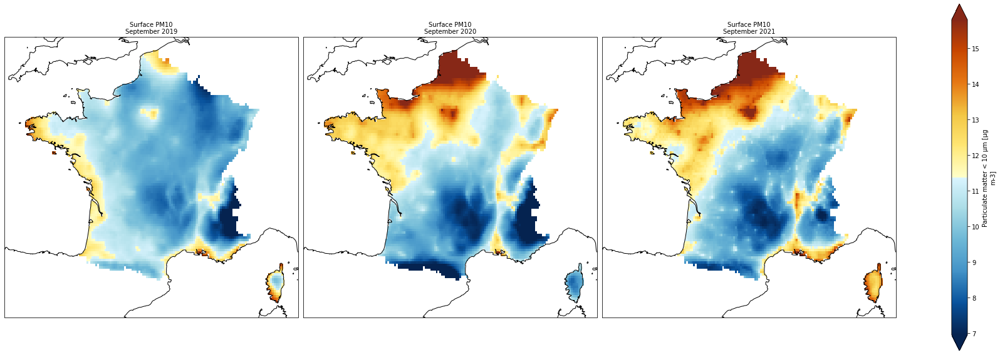

In [31]:
# generate figure
proj_plot = ccrs.Mercator(central_longitude=24.0)

lcmap = cmaps.BlueYellowRed
# Only plot values greater than 0
p = geotiff_dm['PM10'].where(geotiff_dm['PM10'] > 0).plot(x='longitude', y='latitude',transform=ccrs.PlateCarree(),
                            subplot_kws={"projection": proj_plot},
                            size=8,
                            col='year', col_wrap=3, robust=True, cmap=lcmap, add_colorbar=True)

# We have to set the map's options on all four axes
for ax,i in zip(p.axes.flat,  geotiff_dm.year.values):
    ax.coastlines()
    ax.set_title('Surface PM10\n' + 'September ' + str(i), fontsize=10)

plt.savefig('b2drop/PM10_september_FR_2019-2021.png')

#### Plot one single date

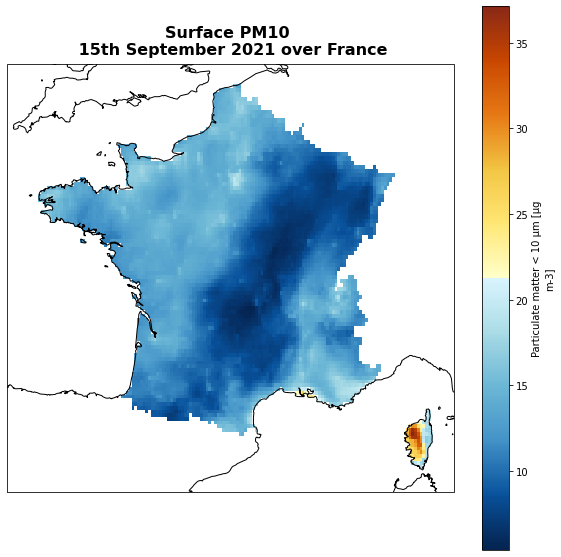

In [32]:
fig=plt.figure(figsize=(10,10))
# Define the projection
crs=ccrs.PlateCarree()

# We're using cartopy and are plotting in Orthographic projection 
# (see documentation on cartopy)
ax = plt.subplot(1, 1, 1, projection=ccrs.Mercator(central_longitude=12.0))
ax.coastlines(resolution='10m')

# custom colormap

lcmap = cmaps.BlueYellowRed

# We need to project our data to the new Mercator projection and for this we use `transform`.
# we set the original data projection in transform (here PlateCarree)
# we only plot values greather than 0
img = geotiff_ds['PM10'].where(geotiff_ds['PM10'] > 0).sel(time='2021-09-15').plot(ax=ax, transform=ccrs.PlateCarree(), cmap=lcmap)  

# Title for plot
plt.title('Surface PM10 \n 15th September 2021 over France',fontsize = 16, fontweight = 'bold', pad=10)
plt.savefig('b2drop/PM10_september_FR_2021-09-15.png')

#### Interactive plot with bokeh

In [33]:
import hvplot.xarray

<div align="center">
    <h1 style="font-size:5vw">PM10 over France from 1st September to 30th September 2021</h1>
</div>

In [34]:
geotiff_ds = geotiff_ds.sortby('time')

In [35]:
geotiff_ds.hvplot.labels( text_font_size='6pt', text_color='blue').opts(xoffset=20)
geotiff_ds.where(geotiff_ds['PM10'] > 0).sel(time=slice('2021-09-01', '2021-09-30')).PM10.hvplot(
    groupby="time",
    cmap=lcmap,
    geo=True,
    coastline='10m',
    frame_width=400,
    clim=(0,35) 
)

:DynamicMap   [time]
   :Overlay
      .Image.I     :Image   [longitude,latitude]   (PM10)
      .Coastline.I :Feature   [Longitude,Latitude]

#### Save Data Cube selection into netCDF

In [36]:
geotiff_ds.to_netcdf("b2drop/PM10_september_FR_2019-2021.nc")

#### Plot a timeseries

<div align="center">
    <h1 style="font-size:5vw">PM10 over Paris from 1st September to 30th September 2021</h1>
</div>

Sort times and then select one location

In [37]:
latitude = 48.864716
longitude = 2.349014

In [38]:
ts = geotiff_ds['PM10'].where(geotiff_ds['PM10'] > 0).sel(latitude=latitude, longitude=longitude, method='nearest').sel(time=slice('2021-09-01', '2021-09-30'))

In [39]:
ts.hvplot(color='purple') * ts.hvplot.scatter(marker='o', color='blue', size=15)

:Overlay
   .Curve.I   :Curve   [time]   (PM10)
   .Scatter.I :Scatter   [time]   (PM10)

#### Save timeseries into tabular (csv) file

In [40]:
ts.to_series().to_csv("b2drop/timeseries_paris_september2021.csv", sep='\t')

## Create Research Object in ROHUB

In [41]:
import os
from modules.rohub import rohub, settings

#### Authenticating

- If the code cell below fails,  make sure you have created the two files:
    - `rohub-user`: contains your rohub username
    - `rohub-pwd`: contains your rohub password

In [42]:
rohub_user = open("rohub-user").read().rstrip()
rohub_pwd = open("rohub-pwd").read().rstrip()

In [43]:
rohub.login(username=rohub_user, password=rohub_pwd)

Logged successfully as annefou.


## Create new basic RO

In [75]:
ro_title="Copernicus Atmosphere Monitoring Service Code Research Object"
ro_research_areas=["Earth sciences"]

ro = rohub.ros_create(title=ro_title, research_areas=ro_research_areas)

Research Object was successfully created with id = 27996037-c285-4cfa-86f9-a8c043d7898c


## Show basic metadata

In [76]:
ro.show_metadata()

{'identifier': '27996037-c285-4cfa-86f9-a8c043d7898c',
 'shared_link': 'https://w3id.org/ro-id/27996037-c285-4cfa-86f9-a8c043d7898c',
 'title': 'Copernicus Atmosphere Monitoring Service Code Research Object',
 'description': None,
 'status': 'LIVE',
 'access_mode': 'PUBLIC',
 'type': 'Basic Research Object',
 'template': None,
 'created': '2021-10-08T10:53:27.918281Z',
 'creator': 'annefou',
 'modificator': 'annefou',
 'modified': None,
 'importer': None,
 'research_areas': ['Earth sciences'],
 'owner': 'annefou',
 'editors': [],
 'readers': [],
 'rating': '0.00',
 'number_of_ratings': 0,
 'number_of_likes': 0,
 'number_of_dislikes': 0,
 'quality': 0,
 'size': 0,
 'creation_mode': 'MANUAL',
 'doi': None,
 'api_link': 'https://rohub2020-rohub.apps.paas-dev.psnc.pl/api/ros/27996037-c285-4cfa-86f9-a8c043d7898c/'}

## Add metadata associated to our Research Object

In [77]:
ro.description="This Research Object demonstrate how to use CAMS European air quality analysis from Copernicus Atmosphere Monitoring with RELIANCE services and compute monthly map of PM10 over a given geographical area."
ro.ros_type="Code Research Research Object"

In [78]:
ro.update()

{'identifier': '27996037-c285-4cfa-86f9-a8c043d7898c',
 'shared_link': 'https://w3id.org/ro-id/27996037-c285-4cfa-86f9-a8c043d7898c',
 'title': 'Copernicus Atmosphere Monitoring Service Code Research Object',
 'description': 'This Research Object demonstrate how to use CAMS European air quality analysis from Copernicus Atmosphere Monitoring with RELIANCE services and compute monthly map of PM10 over a given area',
 'status': 'LIVE',
 'access_mode': 'PUBLIC',
 'type': 'Code Research Research Object',
 'template': None,
 'created': '2021-10-08T10:53:27.918281Z',
 'creator': 'annefou',
 'modificator': 'annefou',
 'modified': '2021-10-08T10:53:40.557386Z',
 'importer': None,
 'research_areas': ['Earth sciences'],
 'owner': 'annefou',
 'editors': [],
 'readers': [],
 'rating': '0.00',
 'number_of_ratings': 0,
 'number_of_likes': 0,
 'number_of_dislikes': 0,
 'quality': 0,
 'size': 1733,
 'creation_mode': 'MANUAL',
 'doi': None,
 'api_link': 'https://rohub2020-rohub.apps.paas-dev.psnc.pl/api

## Aggregate resource (internal)

#### Add our Jupyter Notebook to our Research Object

In [79]:
resi_file_path=os.path.join(os.environ['HOME'], 'RELIANCE_v0.2-France.ipynb')

if pathlib.Path(resi_file_path).exists():
    resi_res_type="Python Script"
    resi_title="Compute and visualize monthly mean maps of CAMS PM10 for different years"
    resi_description="Jupyter Notebook for discovering, accessing and processing and visualizing RELIANCE data cube of CAMS Particule matter < 10 μm [μg/m3]"
    ro.add_internal_resource(res_type=resi_res_type,file_path=resi_file_path, title=resi_title, description=resi_description)

## Aggregate resource (external)

#### Add Results to our Research Object 

- We will be adding all the resources generated by our notebook (data and plots)
- All our data and plots are shared in B2DROP so we will get the shared link from B2DROP and add it to our research object

####  Get shared link from B2DROP
- Make sure you have entered your B2DROP app credentials before starting the jupyterhub service (if you haven't, the code cell below fails).
- Then for each B2DROP resource, we get the corresponding link and add it to the Research Object

In [68]:
import requests
import xml.etree.ElementTree as ET

In [93]:
def getB2dropLink(filename, b2drop_user, b2drop_pwd):
    payload = [('path', filename), ('shareType', 3)]
    r = requests.post("https://b2drop.eudat.eu/ocs/v2.php/apps/files_sharing/api/v1/shares",
                      auth=(b2drop_user, b2drop_pwd),
                      data=payload,
                      headers={"OCS-APIRequest": "true"})
    root = ET.fromstring(r.text)
    return root.find('./data/url').text + '/preview'

##### Authenticate to B2DROP service

In [80]:
b2drop_user = open("/var/run/secrets/egi.eu/b2drop-user").read()
b2drop_pwd = open("/var/run/secrets/egi.eu/b2drop-pwd").read()

#### Add first plot as sketch to my Research Object (external resource from B2DROP)

In [82]:
rese_file_url = getB2dropLink('PM10_september_FR_2019-2021.png', b2drop_user, b2drop_pwd)
rese_res_type="Sketch"
rese_title="Particule matter < 10 μm [μg/m3] over France for September 2019, 2020 and 2021"
rese_description="Monthly average maps of CAMS Particule matter < 10 μm [μg/m3] over France in 2019, 2020 and 2021"
ro.add_external_resource(res_type=rese_res_type, url=rese_file_url, title=rese_title, description=rese_description)

{'identifier': '9147b6af-99c7-45d4-a6b3-d67b6b99bab0',
 'title': 'Particule matter < 10 μm [μg/m3] over France for September 2019, 2020 and 2021',
 'folder': None,
 'ros': ['27996037-c285-4cfa-86f9-a8c043d7898c'],
 'description': None,
 'url': 'https://b2drop.eudat.eu/s/9sBKibfiDNeAN75/preview',
 'name': 'Particule matter < 10 μm [μg/m3] over France for September 2019, 2020 and 2021',
 'filename': None,
 'path': 'https://b2drop.eudat.eu/s/9sBKibfiDNeAN75/preview',
 'size': None,
 'download_url': 'https://b2drop.eudat.eu/s/9sBKibfiDNeAN75/preview',
 'type': 'Sketch',
 'doi': None,
 'read_only': False,
 'cloned': False,
 'api_link': 'https://rohub2020-rohub.apps.paas-dev.psnc.pl/api/resources/9147b6af-99c7-45d4-a6b3-d67b6b99bab0/'}

#### Add second plot as Image to my Research Object (external resource from B2DROP)

In [ ]:
rese_file_url = getB2dropLink('PM10_september_FR_2021-09-15.png', b2drop_user, b2drop_pwd)
rese_res_type="Image"
rese_title="Particule matter < 10 μm [μg/m3] over France on September 15, 2021"
rese_description="Daily average maps of CAMS Particule matter < 10 μm [μg/m3] over France on September 15, 2021"
ro.add_external_resource(res_type=rese_res_type, url=rese_file_url, title=rese_title, description=rese_description)

#### Add timeseries for Paris (external resource from B2DROP)

In [ ]:
rese_file_url = getB2dropLink('timeseries_paris_september2021.csv', b2drop_user, b2drop_pwd)
rese_res_type="Result"
rese_title="Timeseries of particule matter < 10 μm [μg/m3] over Paris in september 2021"
rese_description="Daily average of CAMS Particule matter < 10 μm [μg/m3] over Paris in September 2021"
ro.add_external_resource(res_type=rese_res_type, url=rese_file_url, title=rese_title, description=rese_description)

#### Add netCDF file corresponding to Data cube selection (external resource from B2DROP)

In [ ]:
rese_file_url = getB2dropLink('PM10_september_FR_2019-2021.nc', b2drop_user, b2drop_pwd)
rese_res_type="Result"
rese_title="netCDF data for daily PM10 concentration over France in September 2019, 2020 and 2021"
rese_description="netCDF data corresponding to daily average of CAMS Particule matter < 10 μm [μg/m3] over France for September 2019, September 2020 and September 2021"
ro.add_external_resource(res_type=rese_res_type, url=rese_file_url, title=rese_title, description=rese_description)

### Add geolocation to my Research Object

In [ ]:
geolocation_file_path = os.path.join(os.environ['HOME'],  'fra.geo.json') 
ro.add_geolocation(body_specification_json=geolocation_file_path)

### Publish my Research Object to Zenodo
- Take a snapshot and publis my RO to zenodo

In [83]:
snapshot_id=ro.snapshot(publication_services=["Zenodo"])

Task done successfully


### Load the published Research Object

In [84]:
published_ro = rohub.ros_load(identifier=snapshot_id)

Research Object was successfully loaded with id = 4c855bfb-f089-4691-b9d1-af11feabba12


### Show the DOI and get the link

In [85]:
published_ro.show_publication()

[{'doi': 'https://doi.org/10.5281/zenodo.5556165',
  'storage': 'Zenodo',
  'url': 'https://zenodo.org/record/5556165'}]